In [ ]:
# Install TensorFlow Addons if not already installed
!pip install tensorflow-addons


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 9.4 MB/s eta 0:00:00
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.4.1
    Uninstalling typeguard-4.4.1:
      Successfully uninstalled typeguard-4.4.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inflect 7.4.0 requires typeguard>=4.0.1, but you have typeguard 2.13.3 which is incompatible.


In [ ]:
import os
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Add, Concatenate, ReLU, Lambda, Layer
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from sklearn.model_selection import train_test_split


In [ ]:
import skimage
import os

In [ ]:
import tensorflow as tf
from tensorflow.keras.utils import Progbar

In [ ]:
print(tf.__version__)

2.17.1


In [ ]:
import logging
import time
from tqdm.notebook import tqdm

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import shutil

In [ ]:
from google.colab import files
files.upload()   # upload json api key

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"abdullahshah0","key":"90bc0bf0869fb701e597b8b73cb502f4"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# Download the dataset
!kaggle datasets download praveengovi/coronahack-chest-xraydataset

# Unzip all files
!unzip "/content/coronahack-chest-xraydataset.zip"

Streaming output truncated to the last 5000 lines.
  inflating: Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/train/IM-0446-0001.jpeg  
  inflating: Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/train/IM-0447-0001.jpeg  
  inflating: Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/train/IM-0448-0001.jpeg  
  inflating: Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/train/IM-0449-0001.jpeg  
  inflating: Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/train/IM-0450-0001.jpeg  
  inflating: Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/train/IM-0451-0001.jpeg  
  inflating: Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/train/IM-0452-0001.jpeg  
  inflating: Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/train/IM-0453-0001-0002.jpeg  
  inflating: Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/train/IM-0453-0001.jpeg  
  inflating: Coronahack-Chest-XRay-Dataset/Coronahack

# Data Preps

In [ ]:
os.rename("/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/test", "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/trainO")
os.rename("/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/train", "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/extras")

In [ ]:
os.mkdir("/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/valO")
os.mkdir("/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/valN")
os.mkdir("/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/testO")
os.mkdir("/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/testN")
os.mkdir("/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/trainN")

624 + 250 for training 250 for validation 100 for testing

In [ ]:
source = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/extras/"
destVal = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/valO"
destTest = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/testO"
destTrain = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/trainO"

In [ ]:
def moveData(src,dest,nos):
  for no,i in enumerate(os.listdir(src)):
    if no==nos:
      break
    shutil.move(src+i,dest+"/"+i)

In [ ]:
moveData(source,destTrain,400)
moveData(source,destVal,300)
moveData(source,destTest,200)

In [ ]:
print(len(os.listdir(destTrain)))
print(len(os.listdir(destVal)))
print(len(os.listdir(destTest)))

1024
300
200


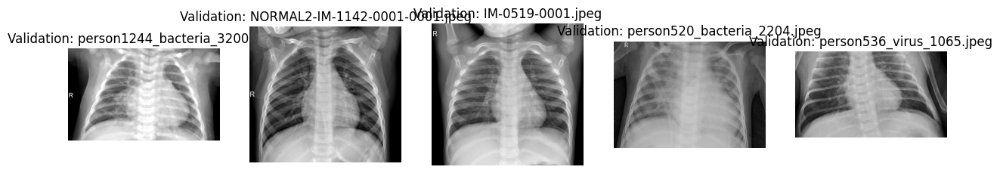

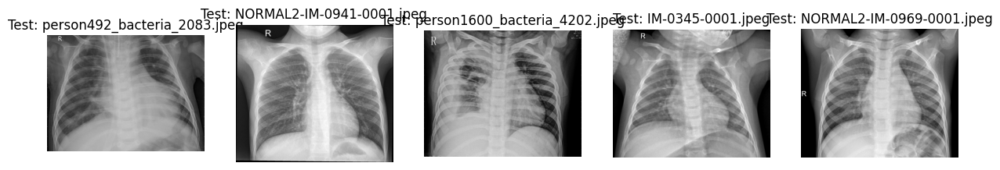

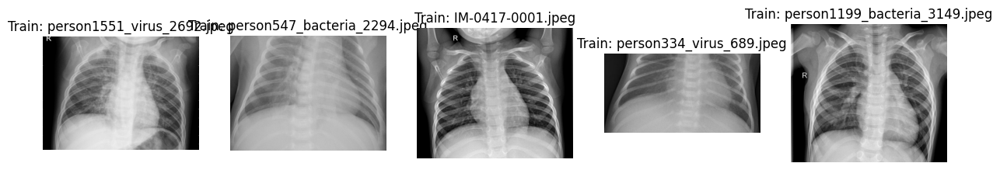

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define paths
destVal = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/valO"
destTest = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/testO"
destTrain = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/trainO"

def visualize_images(folder_path, folder_name, num_images=5):
    images = os.listdir(folder_path)[:num_images]
    plt.figure(figsize=(15, 10))
    for i, img_name in enumerate(images):
        img_path = os.path.join(folder_path, img_name)
        try:
            img = Image.open(img_path)
            plt.subplot(1, num_images, i + 1)
            if img.mode == 'L':  # Grayscale image
                plt.imshow(img, cmap='gray')  # Display in grayscale
            else:
                plt.imshow(img)
            plt.title(f"{folder_name}: {img_name}")
            plt.axis('off')
        except Exception as e:
            print(f"Could not open {img_path}: {e}")
    plt.show()


# Visualize 5 images from each folder
visualize_images(destVal, "Validation")
visualize_images(destTest, "Test")
visualize_images(destTrain, "Train")


# Data Processing

Image Processed and Gaussian White Noise is added.

In [ ]:
def processData(path,noisyDataPath):
  imgsPaths = os.listdir(path)
  imgsPaths = [path+"/"+i for i in imgsPaths]
  spath = noisyDataPath
  print("Processing...")
  pb_i = Progbar(len(imgsPaths))
  for no,p in enumerate(imgsPaths):
    img = image.load_img(p)
    img = image.img_to_array(img)
    img /= 255.0
    noiseImg = skimage.util.random_noise(img,mode='gaussian', clip=True,var=((40/255)**2))
    image.save_img(spath+"img"+str(no)+".jpeg",noiseImg)
    pb_i.add(1)
  print("Saving...")
  pb_i = Progbar(len(imgsPaths))
  for no,src in enumerate(imgsPaths):
    newName = path+"/"+"img"+str(no)+".jpeg"
    os.rename(src,newName)
    pb_i.add(1)

In [ ]:
destTrainN = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/trainN/"
destValN = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/valN/"
destTestN = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/testN/"

In [ ]:
processData(destTrain,destTrainN)

Processing...
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 182s 178ms/step
Saving...
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 0s 31us/step


In [ ]:
processData(destVal,destValN)

Processing...
300/300 ━━━━━━━━━━━━━━━━━━━━ 51s 171ms/step
Saving...
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 41us/step


In [ ]:
processData(destTest,destTestN)

Processing...
200/200 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step
Saving...
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 44us/step


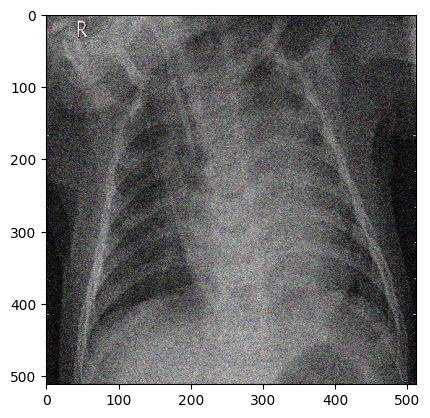

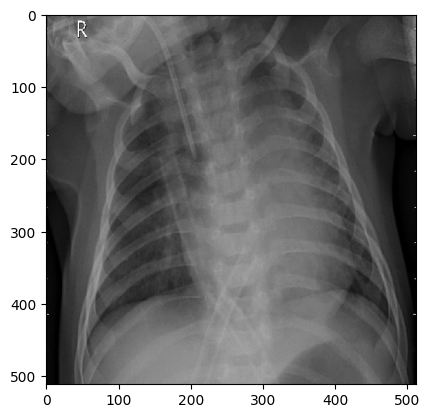

In [ ]:
imgN = image.load_img("/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/trainN/img0.jpeg",target_size=(512,512))
imgN = image.img_to_array(imgN)
imgN /= 255.0

img1 = image.load_img(destTrain+"/"+"img0.jpeg",target_size=(512,512))
img1 = image.img_to_array(img1)
img1 /= 255.0

plt.imshow(imgN)
plt.show()
plt.imshow(img1)
plt.show()

In [ ]:
img1.shape

(512, 512, 3)

In [ ]:
imgN.shape

(512, 512, 3)

In [ ]:
import os
from glob import glob

# Function to load file paths from a directory
def load_image_paths(directory):

    extensions = ('*.png', '*.jpg', '*.jpeg', '*.bmp', '*.tiff', '*.gif')
    files = []
    for ext in extensions:
        files.extend(glob(os.path.join(directory, ext)))
    return files

# Paths to the directories
train_noisy_path = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/trainN/"
train_original_path = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/trainO/"

val_noisy_path = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/valN/"
val_original_path = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/valO/"

test_noisy_path = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/testN/"
test_original_path = "/content/Coronahack-Chest-XRay-Dataset/Coronahack-Chest-XRay-Dataset/testO/"

# Load file paths for training, validation, and test sets
train_noisy_files = load_image_paths(train_noisy_path)
train_original_files = load_image_paths(train_original_path)

val_noisy_files = load_image_paths(val_noisy_path)
val_original_files = load_image_paths(val_original_path)

test_noisy_files = load_image_paths(test_noisy_path)
test_original_files = load_image_paths(test_original_path)

# Validate the loaded paths
print(f"Number of training noisy files: {len(train_noisy_files)}")
print(f"Number of training original files: {len(train_original_files)}")
print(f"Number of validation noisy files: {len(val_noisy_files)}")
print(f"Number of validation original files: {len(val_original_files)}")
print(f"Number of test noisy files: {len(test_noisy_files)}")
print(f"Number of test original files: {len(test_original_files)}")

# Check for mismatched file counts
if len(train_noisy_files) != len(train_original_files):
    raise ValueError("Mismatch between the number of training noisy and original files.")
if len(val_noisy_files) != len(val_original_files):
    raise ValueError("Mismatch between the number of validation noisy and original files.")
if len(test_noisy_files) != len(test_original_files):
    raise ValueError("Mismatch between the number of test noisy and original files.")


Number of training noisy files: 1024
Number of training original files: 1024
Number of validation noisy files: 300
Number of validation original files: 300
Number of test noisy files: 200
Number of test original files: 200


In [ ]:
def load_image(noisy_path, original_path):
    # Load noisy image
    noisy = tf.io.read_file(noisy_path)
    noisy = tf.image.decode_png(noisy, channels=1)
    noisy = tf.image.convert_image_dtype(noisy, tf.float32)  # Normalize to [0,1]

    # Load original image
    original = tf.io.read_file(original_path)
    original = tf.image.decode_png(original, channels=1)
    original = tf.image.convert_image_dtype(original, tf.float32)  # Normalize to [0,1]

    return noisy, original


In [ ]:
def extract_patches(noisy, original, patch_size):
    concatenated = tf.concat([noisy, original], axis=-1)  # Shape: (H, W, C*2)
    concatenated_depth = tf.shape(concatenated)[-1]


    patches = tf.image.extract_patches(
        images=tf.expand_dims(concatenated, 0),
        sizes=[1, patch_size, patch_size, 1],
        strides=[1, patch_size, patch_size, 1],
        rates=[1, 1, 1, 1],
        padding='VALID'
    )


    patches = tf.reshape(patches, [-1, patch_size, patch_size, concatenated_depth])


    noisy_patches = patches[:, :, :, :1]
    original_patches = patches[:, :, :, 1:]

    return noisy_patches, original_patches


In [ ]:
def create_train_dataset(noisy_files, original_files, patch_size, batch_size):
    dataset = tf.data.Dataset.from_tensor_slices((noisy_files, original_files))

    # Shuffle the dataset
    dataset = dataset.shuffle(buffer_size=len(noisy_files))

    # Load images
    dataset = dataset.map(lambda x, y: load_image(x, y), num_parallel_calls=tf.data.AUTOTUNE)

    # Extract patches
    dataset = dataset.map(lambda x, y: extract_patches(x, y, patch_size), num_parallel_calls=tf.data.AUTOTUNE)

    # Flatten the patches
    dataset = dataset.flat_map(lambda x, y: tf.data.Dataset.from_tensor_slices((x, y)))

    # Shuffle patches
    dataset = dataset.shuffle(buffer_size=1000)

    # Batch
    dataset = dataset.batch(batch_size)

    # Prefetch
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset


In [ ]:
def create_val_dataset(noisy_files, original_files, batch_size):
    dataset = tf.data.Dataset.from_tensor_slices((noisy_files, original_files))

    # Load images
    dataset = dataset.map(lambda x, y: load_image(x, y), num_parallel_calls=tf.data.AUTOTUNE)

    # Batch
    dataset = dataset.batch(batch_size)

    # Prefetch
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset


## RDN MODEL

Denoising Model

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Layer, Input, Conv2D, Add, Concatenate, ReLU, Lambda, Multiply
from tensorflow.keras.models import Model

class DenseLayer(Layer):
    def __init__(self, growth_rate, **kwargs):
        super(DenseLayer, self).__init__(**kwargs)
        self.conv = Conv2D(growth_rate, kernel_size=3, padding='same')
        self.relu = ReLU()

    def call(self, x):
        y = self.conv(x)
        y = self.relu(y)
        return Concatenate()([x, y])

    def get_config(self):
        config = super(DenseLayer, self).get_config()
        config.update({
            'growth_rate': self.conv.filters,
            'kernel_size': self.conv.kernel_size,
            'padding': self.conv.padding
        })
        return config

# Custom Residual Dense Block
class ResidualDenseBlock(Layer):
    def __init__(self, input_channels, growth_rate, num_layers, **kwargs):
        super(ResidualDenseBlock, self).__init__(**kwargs)
        self.num_layers = num_layers
        self.growth_rate = growth_rate
        self.input_channels = input_channels

        # Initialize Dense Layers
        self.dense_layers = [DenseLayer(growth_rate) for _ in range(num_layers)]

        # Local Feature Fusion
        self.lff = Conv2D(input_channels, kernel_size=1, padding='same')
        self.add = Add()

    def call(self, x):
        inputs = x
        for layer in self.dense_layers:
            x = layer(x)
        x = self.lff(x)
        return self.add([inputs, x])  # Local Residual Learning

    def get_config(self):
        config = super(ResidualDenseBlock, self).get_config()
        config.update({
            'input_channels': self.input_channels,
            'growth_rate': self.growth_rate,
            'num_layers': self.num_layers
        })
        return config

# RDN for Denoising
def build_rdn_denoising(input_shape=(None, None, 1), num_features=64, growth_rate=64, num_blocks=6, num_layers=6):
    """
    Builds a Residual Dense Network (RDN) model for image denoising.

    Parameters:
    - input_shape: Tuple. Shape of the input image (height, width, channels).
    - num_features: Integer. Number of feature maps in convolutional layers.
    - growth_rate: Integer. Growth rate for DenseLayers.
    - num_blocks: Integer. Number of Residual Dense Blocks.
    - num_layers: Integer. Number of DenseLayers within each Residual Dense Block.

    Returns:
    - model: Keras Model instance.
    """

    inputs = Input(shape=input_shape)

    # Shallow Feature Extraction
    sfe1 = Conv2D(num_features, kernel_size=3, padding='same', activation='relu')(inputs)
    sfe2 = Conv2D(num_features, kernel_size=3, padding='same', activation='relu')(sfe1)

    # Residual Dense Blocks
    x = sfe2
    rdb_outputs = []
    for i in range(num_blocks):
        rdb = ResidualDenseBlock(input_channels=num_features, growth_rate=growth_rate, num_layers=num_layers)
        x = rdb(x)
        rdb_outputs.append(x)

    # Global Feature Fusion
    x = Concatenate()(rdb_outputs)
    x = Conv2D(num_features, kernel_size=1, padding='same', activation='relu')(x)
    x = Conv2D(num_features, kernel_size=3, padding='same', activation='relu')(x)

    # First Global Residual Learning Addition
    x = Add()([x, sfe1])  # Adding the shallow feature map to fused features

    # Second Element-Wise Addition
    outputs = Add()([x, sfe2])  # Adding shallow feature map again for denoising

    # Final Reconstruction
    outputs = Conv2D(input_shape[-1], kernel_size=3, padding='same', activation='sigmoid')(outputs)

    return Model(inputs, outputs)


In [ ]:
import tensorflow as tf

def ssim_metric(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

def psnr_metric(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    return tf.image.psnr(y_true, y_pred, max_val=1.0)


In [ ]:
input_shape = (None, None, 1)
model = build_rdn_denoising(input_shape=input_shape, num_features=64, growth_rate=64, num_blocks=6, num_layers=6)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='mean_squared_error',
    metrics=['mean_squared_error', 'mean_absolute_error', psnr_metric, ssim_metric]
)



# Summary of the model
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, None, None, 1)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, None, None, 64) │            640 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, None, None, 64) │         36,928 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ residual_dense_block      │ (None, None, None, 64) │        803,264 │ conv2d_1[0][0]         │
│ (ResidualDenseBlock)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ residual_dense_block_1    │ (None, None, None, 64) │        803,264 │ residual_dense_block[… │
│ (ResidualDenseBlock)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ residual_dense_block_2    │ (None, None, None, 64) │        803,264 │ residual_dense_block_… │
│ (ResidualDenseBlock)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ residual_dense_block_3    │ (None, None, None, 64) │        803,264 │ residual_dense_block_… │
│ (ResidualDenseBlock)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ residual_dense_block_4    │ (None, None, None, 64) │        803,264 │ residual_dense_block_… │
│ (ResidualDenseBlock)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ residual_dense_block_5    │ (None, None, None, 64) │        803,264 │ residual_dense_block_… │
│ (ResidualDenseBlock)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_108           │ (None, None, None,     │              0 │ residual_dense_block[… │
│ (Concatenate)             │ 384)                   │                │ residual_dense_block_… │
│                           │                        │                │ residual_dense_block_… │
│                           │                        │                │ residual_dense_block_… │
│                           │                        │                │ residual_dense_block_… │
│                           │                        │                │ residual_dense_block_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_44 (Conv2D)        │ (None, None, None, 64) │         24,640 │ concatenate_108[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_45 (Conv2D)        │ (None, None, None, 64) │         36,928 │ conv2d_44[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_6 (Add)               │ (None, None, None, 64) │              0 │ conv2d_45[0][0],       │
│                           │                        │                │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_7 (Add)          

 Total params: 4,919,297 (18.77 MB)

 Trainable params: 4,919,297 (18.77 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
import math

def step_decay(epoch, lr):
    drop = 0.1
    epochs_drop = int(total_epochs * 0.8)
    if epoch >= epochs_drop:
        return lr * drop
    return lr

total_epochs = 20

lr_scheduler = LearningRateScheduler(step_decay, verbose=1)


In [ ]:
checkpoint_filepath = '/content/rdn_best_model.keras'

model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    monitor='psnr',
    verbose=1,
    save_best_only=True,
    mode='max'
)


## Data Gen

In [ ]:
# Parameters
patch_size = 32
batch_size = 16
total_epochs = 20

# Create training dataset
train_dataset_tf = create_train_dataset(
    noisy_files=train_noisy_files,
    original_files=train_original_files,
    patch_size=patch_size,
    batch_size=batch_size
)

# Create validation dataset
val_dataset_tf = create_val_dataset(
    noisy_files=val_noisy_files,
    original_files=val_original_files,
    batch_size=1
)


In [ ]:
import tensorflow as tf
from datetime import datetime

# Define TensorBoard log directory
log_dir = "logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")

# Create TensorBoard callback
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1,  # Log histograms of weights every epoch
    write_graph=True,  # Log the computation graph
    write_images=True,  # Log images (like model outputs)
    update_freq="batch",  # Frequency of updates (e.g., per batch)
    profile_batch=2  # Enable profiling for batch 2
)


In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs/fit


<IPython.core.display.Javascript object>

In [ ]:
from tensorflow.keras.mixed_precision import set_global_policy
set_global_policy('mixed_float16')


steps_per_epoch = (len(os.listdir(train_noisy_path)) * 16) // batch_size

model.fit(
    train_dataset_tf,
    epochs=total_epochs,
    steps_per_epoch=steps_per_epoch,
    validation_steps=(len(os.listdir(val_noisy_path)) * 16) // batch_size,
    callbacks=[lr_scheduler, model_checkpoint, tensorboard_callback]
)




Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 1/20
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 3.1308e-04 - mean_absolute_error: 0.0133 - mean_squared_error: 3.1299e-04 - psnr_metric: 36.1712 - ssim_metric: 0.8976

/usr/local/lib/python3.10/dist-packages/keras/src/callbacks/model_checkpoint.py:206: UserWarning: Can save best model only with psnr available, skipping.
  self._save_model(epoch=epoch, batch=None, logs=logs)


1024/1024 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - loss: 3.1310e-04 - mean_absolute_error: 0.0133 - mean_squared_error: 3.1300e-04 - psnr_metric: 36.1709 - ssim_metric: 0.8976 - learning_rate: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 2/20
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 48s 47ms/step - loss: 2.9957e-04 - mean_absolute_error: 0.0130 - mean_squared_error: 2.9957e-04 - psnr_metric: 36.3043 - ssim_metric: 0.8923 - learning_rate: 1.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 3/20
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 49s 47ms/step - loss: 1.8766e-04 - mean_absolute_error: 0.0101 - mean_squared_error: 1.8771e-04 - psnr_metric: 38.7077 - ssim_metric: 0.9481 - learning_rate: 1.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 4/20
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 48s 46ms/step - loss: 4.0803e-04 - mean_absolute_error: 0.0144 - mean_squared_error: 4.0810e-04 

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
import os

def datagen(noisy_folder, original_folder, batch_size=32, img_size=(512,512)):
    noisy_images = sorted(os.listdir(noisy_folder))
    original_images = sorted(os.listdir(original_folder))

    # Verify that we have the same number of images in both folders
    assert len(noisy_images) == len(original_images), \
        f"Mismatch in number of images: {len(noisy_images)} noisy images and {len(original_images)} original images."

    while True:
        batch_noisy = []
        batch_original = []

        for i in range(batch_size):
            idx = np.random.randint(0, len(noisy_images))

            # Load the noisy and original images
            noisy_img = image.load_img(os.path.join(noisy_folder, noisy_images[idx]), target_size=img_size, color_mode="grayscale")
            noisy_img = image.img_to_array(noisy_img) / 255.0

            original_img = image.load_img(os.path.join(original_folder, original_images[idx]), target_size=img_size, color_mode="grayscale")
            original_img = image.img_to_array(original_img) / 255.0

            batch_noisy.append(noisy_img)
            batch_original.append(original_img)

        yield (np.array(batch_noisy), np.array(batch_original))


1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step


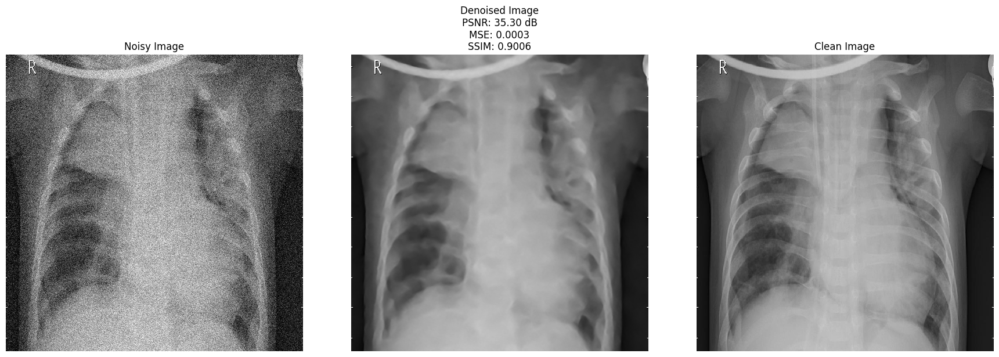

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


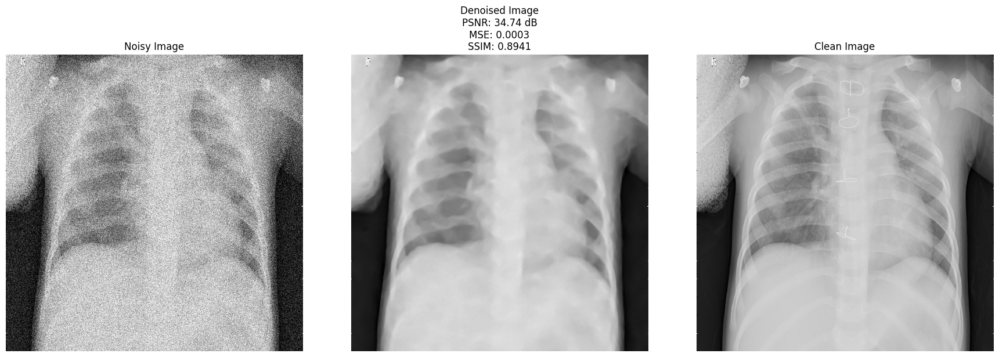

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


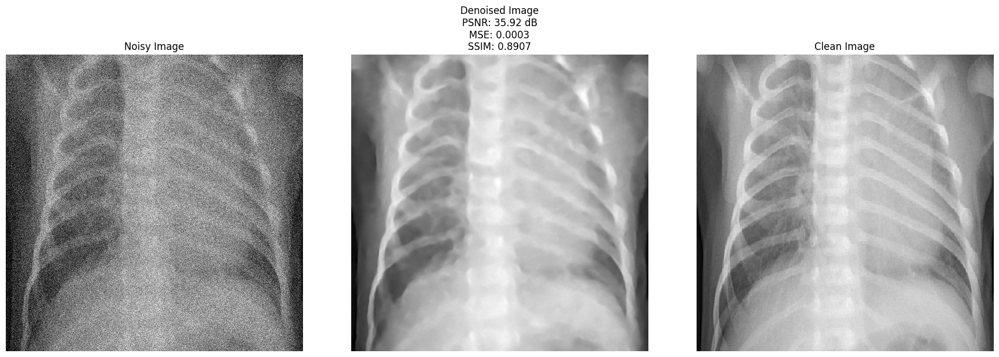

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


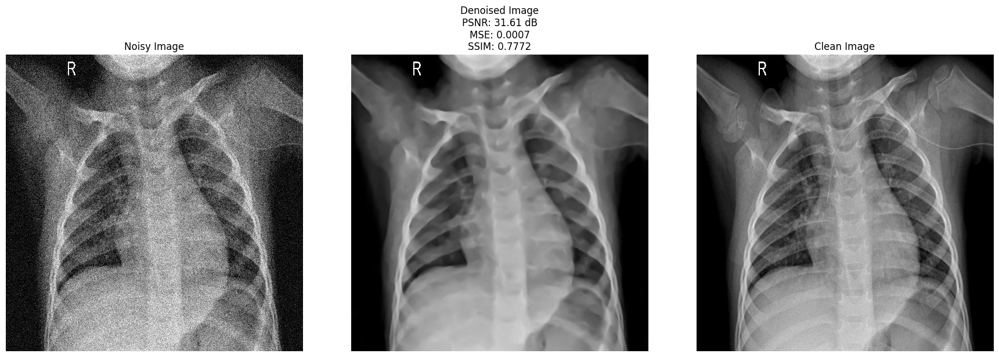

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


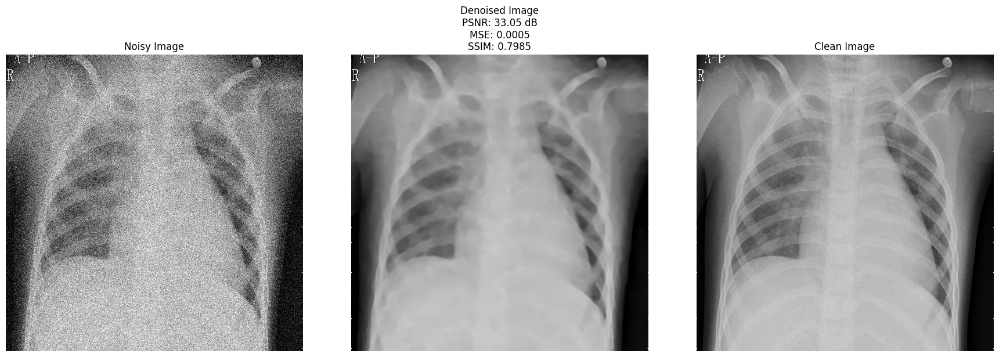

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━

In [ ]:
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.metrics import Mean

def evaluate_with_ssim(model, test_generator, steps, visualize_samples=5):
    """
    Evaluate the dataset with PSNR, MSE, and SSIM and visualize denoising results.

    Parameters:
    - model: The trained denoising model.
    - test_generator: Data generator for the test dataset.
    - steps: Number of test steps (number of images in the dataset).
    - visualize_samples: Number of samples to visualize.

    Returns:
    - Average PSNR, MSE, and SSIM for the test dataset.
    """
    psnr_metric = Mean(name="psnr")
    mse_metric = Mean(name="mse")
    ssim_metric = Mean(name="ssim")

    # Visualize a few samples
    visualized_count = 0

    for step in range(steps):
        noisy_images, clean_images = next(test_generator)

        # Predict denoised images
        denoised_images = model.predict(noisy_images)

        # Calculate PSNR, MSE, and SSIM for each image
        for i in range(len(clean_images)):
            # MSE
            mse = np.mean((clean_images[i] - denoised_images[i]) ** 2)
            mse_metric.update_state(mse)

            # PSNR
            psnr = 20 * np.log10(1.0 / np.sqrt(mse)) if mse > 0 else 100
            psnr_metric.update_state(psnr)

            # SSIM
            ssim_value = ssim(
                clean_images[i].squeeze(),
                denoised_images[i].squeeze(),
                data_range=1.0
            )
            ssim_metric.update_state(ssim_value)

            # Visualize a sample
            if visualized_count < visualize_samples:
                show_denoised_sample_with_metrics(
                    noisy_images[i], denoised_images[i], clean_images[i], psnr, mse, ssim_value
                )
                visualized_count += 1

    return {
        "Average PSNR": psnr_metric.result().numpy(),
        "Average MSE": mse_metric.result().numpy(),
        "Average SSIM": ssim_metric.result().numpy()
    }

def show_denoised_sample_with_metrics(noisy_image, denoised_image, clean_image, psnr, mse, ssim_value):
    """
    Display the noisy, denoised, and original images side by side with metrics.

    Parameters:
    - noisy_image: The noisy input image.
    - denoised_image: The output from the model.
    - clean_image: The ground truth clean image.
    - psnr: PSNR value for the image.
    - mse: MSE value for the image.
    - ssim_value: SSIM value for the image.
    """
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(noisy_image.squeeze(), cmap='gray')
    axes[0].set_title("Noisy Image")
    axes[0].axis("off")

    axes[1].imshow(denoised_image.squeeze(), cmap='gray')
    axes[1].set_title(f"Denoised Image\nPSNR: {psnr:.2f} dB\nMSE: {mse:.4f}\nSSIM: {ssim_value:.4f}")
    axes[1].axis("off")

    axes[2].imshow(clean_image.squeeze(), cmap='gray')
    axes[2].set_title("Clean Image")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

# Load the test generator
test_generator = datagen(
    noisy_folder=test_noisy_path,
    original_folder=test_original_path,
    batch_size=1
)


test_steps = len(os.listdir(test_noisy_path))


evaluation_results = evaluate_with_ssim(
    model=model,
    test_generator=test_generator,
    steps=test_steps,
    visualize_samples=5

# Print the evaluation results
print("Test Dataset Evaluation Results:")
print(f"Average PSNR: {evaluation_results['Average PSNR']:.2f} dB")
print(f"Average MSE: {evaluation_results['Average MSE']:.6f}")
print(f"Average SSIM: {evaluation_results['Average SSIM']:.4f}")



.
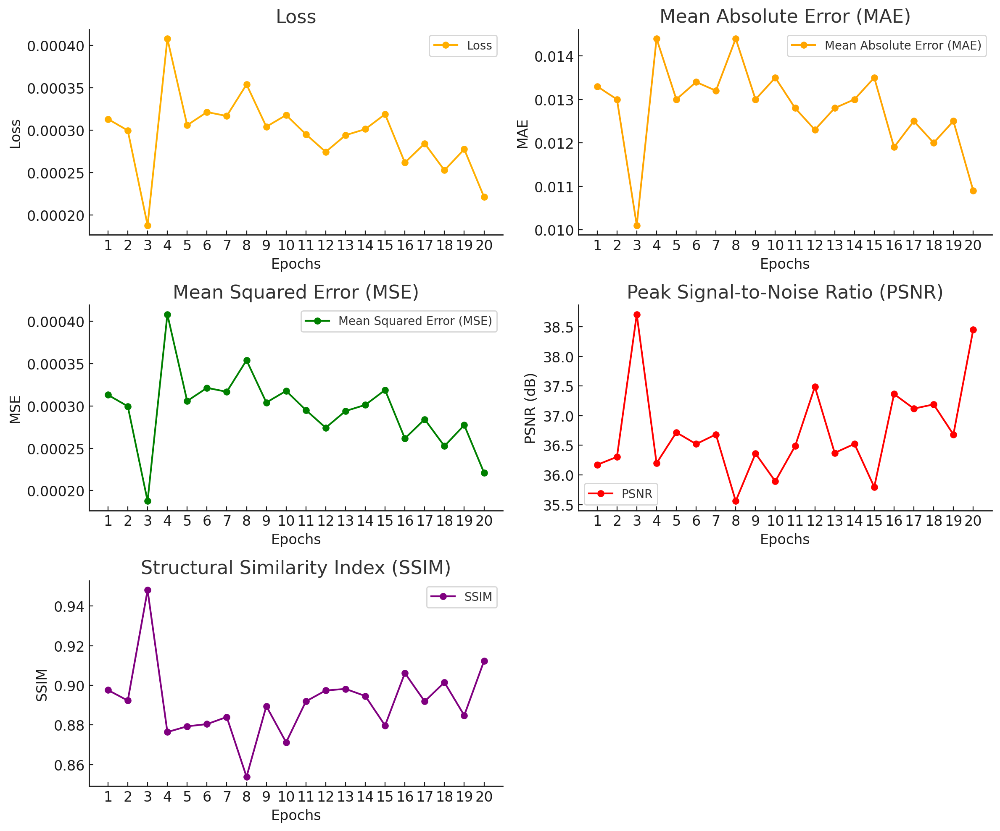
